In [9]:
def polygon_to_mask(poly, image_shape):
    """
    Converts an (N, 2) polygon to a binary mask of shape (H, W).
    """
    h, w = image_shape[:2]
    mask = np.zeros((h, w), dtype=np.uint8)
    pts = np.round(poly).astype(np.int32)
    cv2.fillPoly(mask, [pts], 1)
    return mask.astype(bool)


In [10]:
def cyclev3(j, i):
    """
    Your original segmenter call; returns:
      - polygons: list of (N×2) float arrays of the mask outlines
      - class_ids: 1D int array, same length as polygons
      - names:     dict mapping class_id → class_name
    """
    home     = os.path.expanduser("~")
    weights  = f"{home}/models/jakes-loped/jakes-finder-mk1/1/weights.pt"
    img_path = f"{home}/SubwaySurfers/train_screenshots/frame_03{j}{i}.jpg"

    img = Image.open(img_path)
    img = img.resize((600, 400))
    display(img)

    model   = YOLO(weights)
    results = model.predict(
        source=img_path, task="segment", conf=0.30, iou=0.45
    )[0]

    polygons1   = results.masks.xy
    class_ids1  = results.boxes.cls.cpu().numpy().astype(int)
    names1      = results.names
    
    return polygons1, class_ids1, names1, img_path

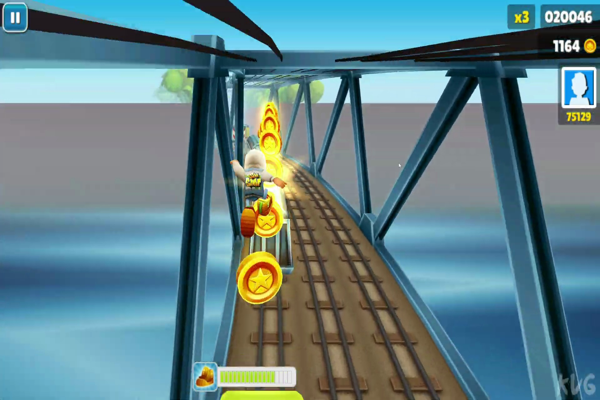


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0383.jpg: 864x1504 1 GREYTRAIN, 1 Rails, 293.3ms
Speed: 12.1ms preprocess, 293.3ms inference, 5.5ms postprocess per image at shape (1, 3, 864, 1504)
[Timing] Inference (cyclev3): 0.523s
[Timing] Rail‐polygon filter: 0.000s
[Timing] Polygon→mask rasterization: 0.009s
[Timing] Color matching: 0.089s
[Timing] Component filtering: 0.016s


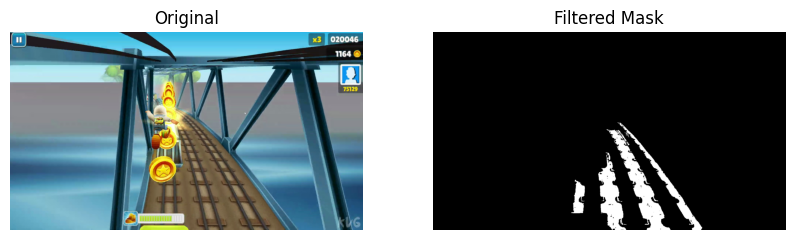

[Timing] Total highlight call: 0.434s


In [14]:
import time
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from PIL import Image
from IPython.display import display

# instrumented cyclev3 wrapper
t0 = time.time()
polygons, cls_ids, names, img_path = cyclev3(8, 3)
t1 = time.time()
print(f"[Timing] Inference (cyclev3): {t1 - t0:.3f}s")

# filter for rails
t0 = time.time()
rail_polys = [p for p, c in zip(polygons, cls_ids) if c == 9]
t1 = time.time()
print(f"[Timing] Rail‐polygon filter: {t1 - t0:.3f}s")

# rasterize first rail
t0 = time.time()
img = cv2.imread(img_path)
rail_mask = polygon_to_mask(rail_polys[0], img.shape)
t1 = time.time()
print(f"[Timing] Polygon→mask rasterization: {t1 - t0:.3f}s")

# now instrument the highlight function itself
def highlight_rails_mask_only_timed(
    img_path, rail_mask, target_colors_rgb, tolerance=30.0,
    min_region_size=50, min_region_height=1000
):
    img = cv2.imread(img_path)
    h, w = img.shape[:2]

    # color‐matching
    t0 = time.time()
    targets_bgr = [(c[2], c[1], c[0]) for c in target_colors_rgb]
    img_f = img.astype(np.float32)
    color_mask = np.zeros((h, w), dtype=bool)
    for tb in targets_bgr:
        tb_arr = np.array(tb, dtype=np.float32).reshape((1,1,3))
        dist = np.linalg.norm(img_f - tb_arr, axis=2)
        color_mask |= (dist <= tolerance)
    t1 = time.time()
    print(f"[Timing] Color matching: {t1 - t0:.3f}s")

    # component filtering
    t0 = time.time()
    combined = rail_mask & color_mask
    comp_uint8 = combined.astype(np.uint8)
    n_labels, labels, stats, _ = cv2.connectedComponentsWithStats(comp_uint8, 8)
    filtered = np.zeros_like(combined)
    for lbl in range(1, n_labels):
        area   = stats[lbl, cv2.CC_STAT_AREA]
        height = stats[lbl, cv2.CC_STAT_HEIGHT]
        if area >= min_region_size and height >= min_region_height:
            filtered[labels == lbl] = True
    t1 = time.time()
    print(f"[Timing] Component filtering: {t1 - t0:.3f}s")

    # display
    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); plt.axis('off'); plt.title("Original")
    plt.subplot(1,2,2)
    plt.imshow(filtered, cmap='gray'); plt.axis('off'); plt.title("Filtered Mask")
    plt.show()

    return filtered

# run the timed version
t0 = time.time()
filtered_mask = highlight_rails_mask_only_timed(
    img_path,
    rail_mask=rail_mask,
    target_colors_rgb=[(119,104,67),(81,42,45)],
    tolerance=20,
    min_region_size=50,
    min_region_height=150
)
t1 = time.time()
print(f"[Timing] Total highlight call: {t1 - t0:.3f}s")


Inference device: mps
YOLO11n-seg summary (fused): 113 layers, 2,836,908 parameters, 0 gradients, 10.2 GFLOPs
WARNING ⚠️ NMS time limit 2.050s exceeded
Inference (cyclev4): 11.396s
Rail‐polygon filter: 0.000s
Polygon→mask rasterization: 0.011s
Highlight superfast: 0.008s


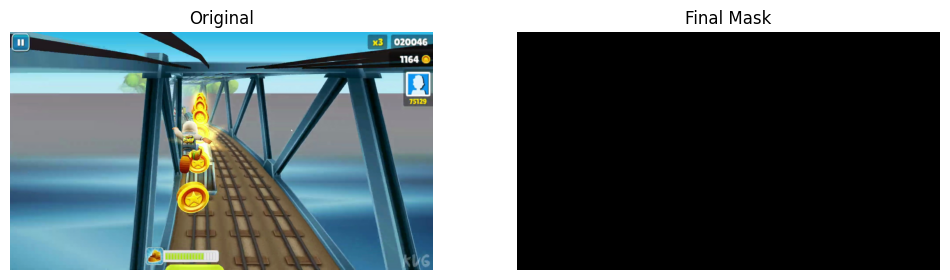


Processing frame_0300
 Inference: 0.562s
 Mask rasterize: 0.012s
 Highlight: 0.023s

Processing frame_0301
WARNING ⚠️ NMS time limit 2.050s exceeded
 Inference: 2.876s
 Mask rasterize: 0.012s
 Highlight: 0.012s

Processing frame_0302
 Inference: 0.144s
 Mask rasterize: 0.009s
 Highlight: 0.009s

Processing frame_0303
 Inference: 0.371s
 Mask rasterize: 0.009s
 Highlight: 0.007s

Processing frame_0304
 Inference: 0.139s
 Mask rasterize: 0.008s
 Highlight: 0.007s

Processing frame_0310
 Inference: 0.138s
 Mask rasterize: 0.009s
 Highlight: 0.008s

Processing frame_0311
 Inference: 0.267s
 Mask rasterize: 0.011s
 Highlight: 0.009s

Processing frame_0312
 Inference: 0.344s
 Mask rasterize: 0.011s
 Highlight: 0.007s

Processing frame_0313
 Inference: 0.134s
 Mask rasterize: 0.009s
 Highlight: 0.007s

Processing frame_0314
 Inference: 0.140s
 Mask rasterize: 0.009s
 Highlight: 0.007s

Processing frame_0320
 Inference: 0.145s
 Mask rasterize: 0.009s
 Highlight: 0.007s

Processing frame_0321


In [16]:
import os
import time
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
from ultralytics import YOLO
from PIL import Image

# ─── Helpers ──────────────────────────────────────────────────────────────────

def polygon_to_mask(poly, image_shape):
    h, w = image_shape[:2]
    mask = np.zeros((h, w), dtype=np.uint8)
    pts = np.round(poly).astype(np.int32)
    cv2.fillPoly(mask, [pts], 1)
    return mask.astype(bool)

def highlight_rails_superfast(
    img, rail_mask, target_colors_rgb, tol, min_area, min_height
):
    # img: BGR numpy array, rail_mask: bool (H,W)
    h, w = img.shape[:2]
    # crop ROI
    ys, xs = np.nonzero(rail_mask)
    y0, y1 = ys.min(), ys.max()+1
    x0, x1 = xs.min(), xs.max()+1
    roi = img[y0:y1, x0:x1]
    mask_roi = rail_mask[y0:y1, x0:x1].astype(np.uint8)

    # fast color threshold in BGR
    b1,g1,r1 = target_colors_rgb[0]
    b2,g2,r2 = target_colors_rgb[1]
    lb1 = np.clip((b1-tol, g1-tol, r1-tol),  0,255)
    ub1 = np.clip((b1+tol, g1+tol, r1+tol),  0,255)
    lb2 = np.clip((b2-tol, g2-tol, r2-tol),  0,255)
    ub2 = np.clip((b2+tol, g2+tol, r2+tol),  0,255)

    m1 = cv2.inRange(roi, lb1, ub1)
    m2 = cv2.inRange(roi, lb2, ub2)
    color_mask = cv2.bitwise_or(m1, m2)

    # combine + morphology to drop short regions
    combined = cv2.bitwise_and(mask_roi, (color_mask>0).astype(np.uint8))
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, min_height))
    opened = cv2.morphologyEx(combined, cv2.MORPH_OPEN, kernel)

    # area filter via contours
    final = np.zeros_like(opened)
    cnts, _ = cv2.findContours(opened, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    for cnt in cnts:
        x,y,wc,hc = cv2.boundingRect(cnt)
        if cv2.contourArea(cnt) >= min_area:
            cv2.drawContours(final, [cnt], -1, 1, cv2.FILLED)

    # expand back to full frame
    full = np.zeros((h, w), dtype=np.uint8)
    full[y0:y1, x0:x1] = final

    return full.astype(bool)

# ─── Model setup ─────────────────────────────────────────────────────────────

device = "cuda" if torch.cuda.is_available() else ("mps" if torch.backends.mps.is_available() else "cpu")
print("Inference device:", device)
home    = os.path.expanduser("~")
weights = f"{home}/models/jakes-loped/jakes-finder-mk1/1/weights.pt"
model   = YOLO(weights)
model.fuse()
model.overrides["half"] = True

# ─── Inference function ──────────────────────────────────────────────────────

def cyclev4(j, i):
    img_path = f"{home}/SubwaySurfers/train_screenshots/frame_03{j}{i}.jpg"
    img_pil  = Image.open(img_path).convert("RGB")
    img_pil  = img_pil.resize((640, 360))  # downscale for speed
    results  = model.predict(
        source=img_pil,
        task="segment",
        device=device,
        conf=0.30,
        iou=0.45,
        half=True,
        verbose=False
    )[0]
    polys    = results.masks.xy
    cls_ids  = results.boxes.cls.cpu().numpy().astype(int)
    return polys, cls_ids, img_path

# ─── Single‐frame timing example ──────────────────────────────────────────────

# 1) Inference
t0 = time.time()
polygons, cls_ids, img_path = cyclev4(8, 3)
t1 = time.time()
print(f"Inference (cyclev4): {t1-t0:.3f}s")

# 2) Rail polygon filter
t0 = time.time()
rail_polys = [p for p,c in zip(polygons, cls_ids) if c==9]
t1 = time.time()
print(f"Rail‐polygon filter: {t1-t0:.3f}s")

# 3) Rasterize
t0 = time.time()
img = cv2.imread(img_path)
rail_mask = polygon_to_mask(rail_polys[0], img.shape)
t1 = time.time()
print(f"Polygon→mask rasterization: {t1-t0:.3f}s")

# 4) Highlight
t0 = time.time()
filtered_mask = highlight_rails_superfast(
    img, rail_mask,
    target_colors_rgb=[(119,104,67),(81,42,45)],
    tol=20,
    min_area=50,
    min_height=150
)
t1 = time.time()
print(f"Highlight superfast: {t1-t0:.3f}s")

# 5) Display results
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); plt.axis('off'); plt.title("Original")
plt.subplot(1,2,2)
plt.imshow(filtered_mask, cmap='gray'); plt.axis('off'); plt.title("Final Mask")
plt.show()

# ─── Batch processing loop ───────────────────────────────────────────────────

for j in range(0,3):
    for i in range(0,5):
        print(f"\nProcessing frame_03{j}{i}")
        t0 = time.time()
        polys, cls_ids, img_path = cyclev4(j, i)
        t_inf = time.time()
        print(f" Inference: {t_inf-t0:.3f}s")

        rail = [p for p,c in zip(polys, cls_ids) if c==9]
        if not rail:
            print("  → no rail detected, skipping")
            continue

        img = cv2.imread(img_path)
        mask = polygon_to_mask(rail[0], img.shape)
        t_m = time.time()
        print(f" Mask rasterize: {t_m-t_inf:.3f}s")

        filt = highlight_rails_superfast(
            img, mask, [(119,104,67),(81,42,45)], tol=20, min_area=50, min_height=150
        )
        t_f = time.time()
        print(f" Highlight: {t_f-t_m:.3f}s")


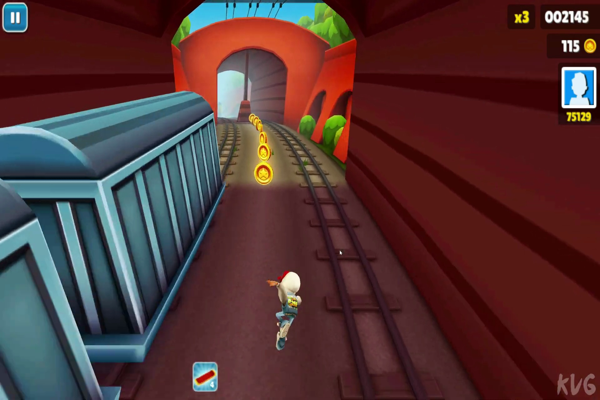

[Timing] Inference (cyclev3, cached): 0.528s
[Timing] Rail‐polygon filter: 0.000s
[Timing] Polygon→mask rasterization: 0.010s
[Timing] Color matching: 0.091s
[Timing] Component filtering: 0.017s


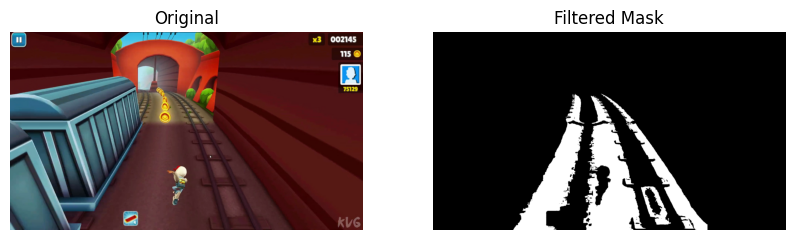

[Timing] Total highlight call: 0.429s


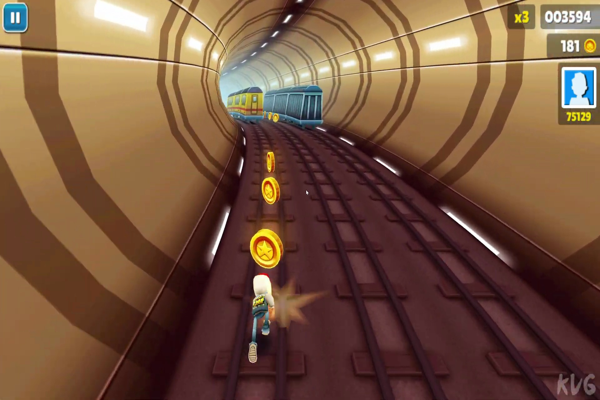

[Timing] Inference (cyclev3, cached): 0.470s
[Timing] Rail‐polygon filter: 0.000s
[Timing] Polygon→mask rasterization: 0.009s
[Timing] Color matching: 0.094s
[Timing] Component filtering: 0.015s


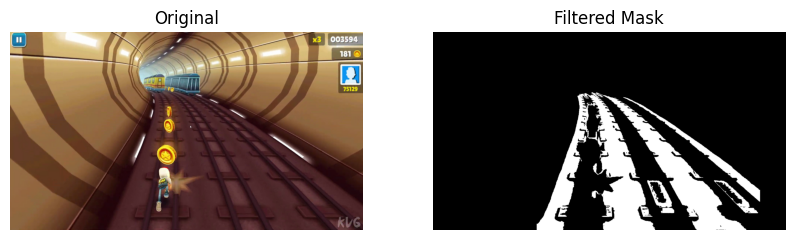

[Timing] Total highlight call: 0.400s


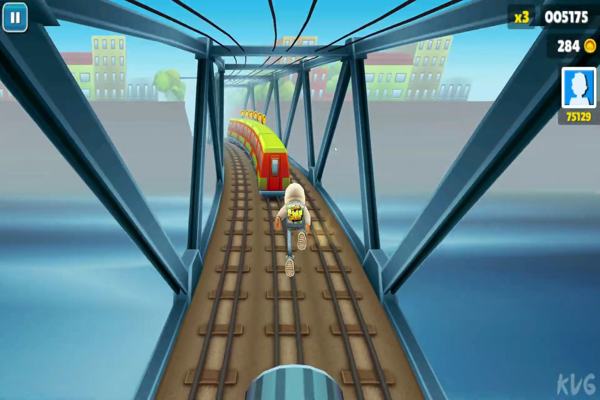

[Timing] Inference (cyclev3, cached): 0.462s
[Timing] Rail‐polygon filter: 0.000s
[Timing] Polygon→mask rasterization: 0.009s
[Timing] Color matching: 0.095s
[Timing] Component filtering: 0.016s


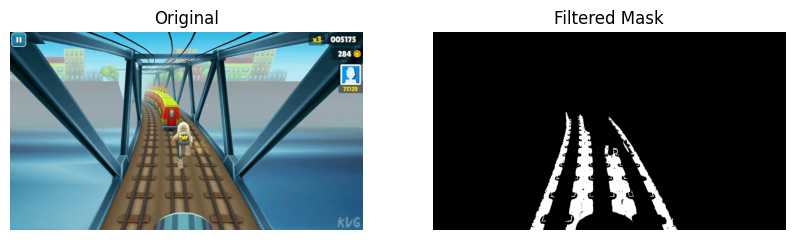

[Timing] Total highlight call: 0.390s


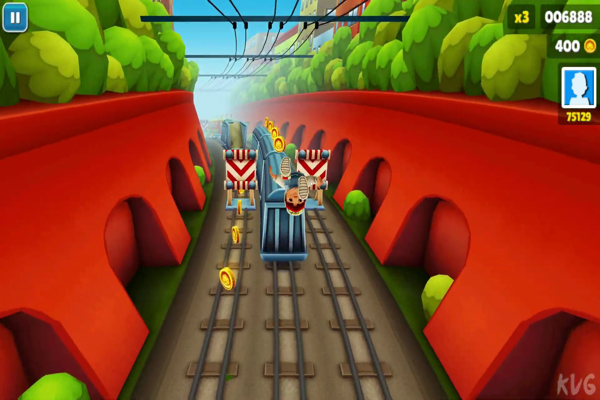

[Timing] Inference (cyclev3, cached): 0.503s
[Timing] Rail‐polygon filter: 0.000s
[Timing] Polygon→mask rasterization: 0.010s
[Timing] Color matching: 0.095s
[Timing] Component filtering: 0.017s


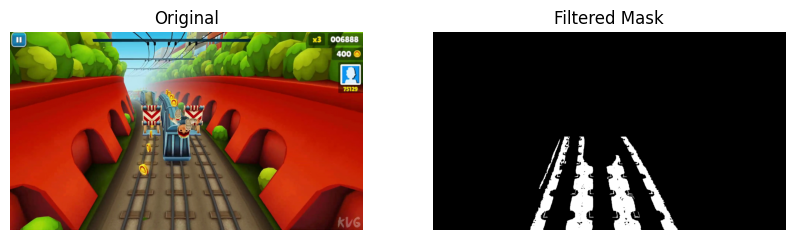

[Timing] Total highlight call: 0.468s


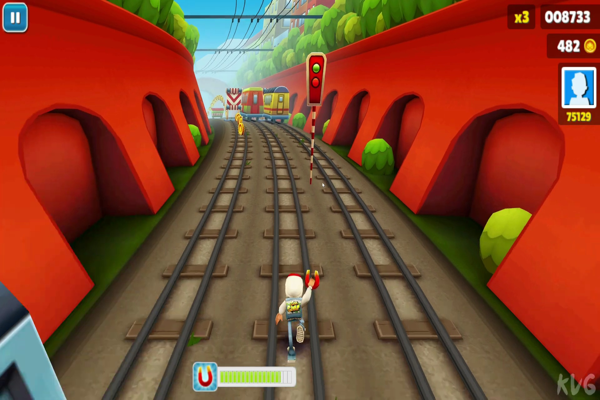

[Timing] Inference (cyclev3, cached): 0.423s
[Timing] Rail‐polygon filter: 0.000s
[Timing] Polygon→mask rasterization: 0.009s
[Timing] Color matching: 0.092s
[Timing] Component filtering: 0.019s


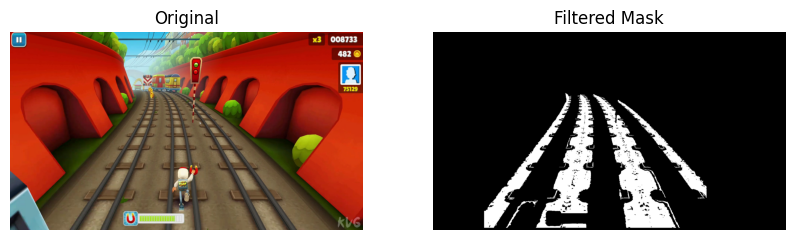

[Timing] Total highlight call: 0.434s


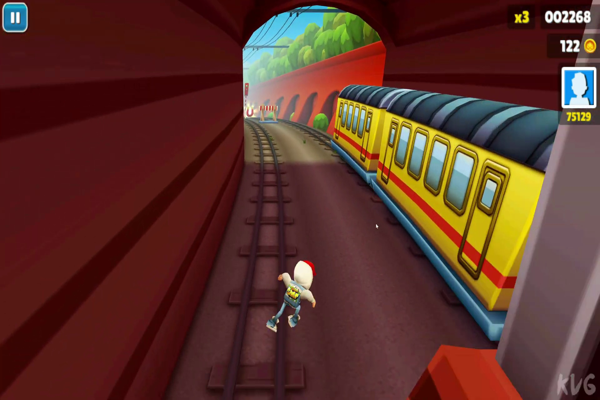

[Timing] Inference (cyclev3, cached): 0.422s
[Timing] Rail‐polygon filter: 0.000s
[Timing] Polygon→mask rasterization: 0.009s
[Timing] Color matching: 0.093s
[Timing] Component filtering: 0.016s


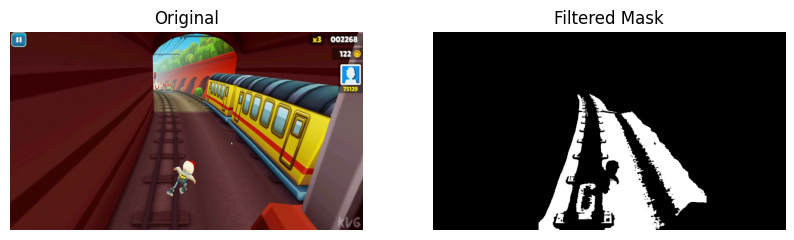

[Timing] Total highlight call: 0.441s


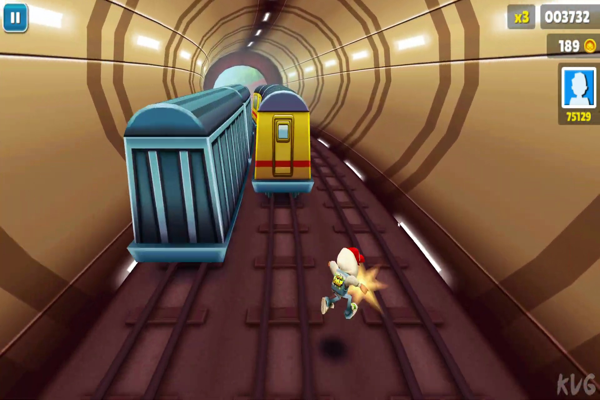

[Timing] Inference (cyclev3, cached): 0.415s
[Timing] Rail‐polygon filter: 0.000s
[Timing] Polygon→mask rasterization: 0.009s
[Timing] Color matching: 0.091s
[Timing] Component filtering: 0.019s


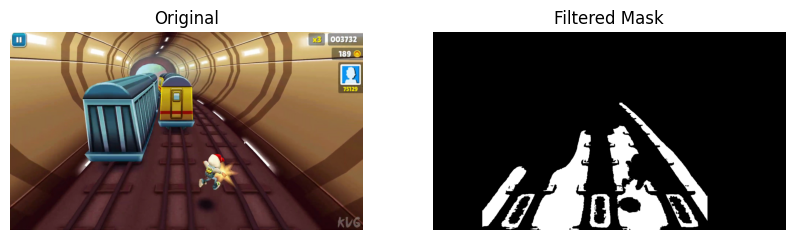

[Timing] Total highlight call: 0.438s


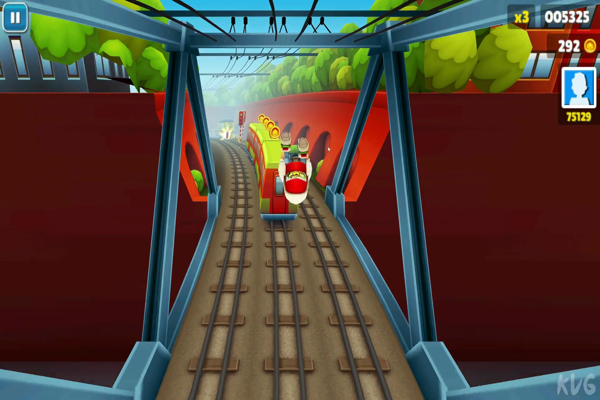

[Timing] Inference (cyclev3, cached): 0.441s
[Timing] Rail‐polygon filter: 0.000s
[Timing] Polygon→mask rasterization: 0.009s
[Timing] Color matching: 0.091s
[Timing] Component filtering: 0.016s


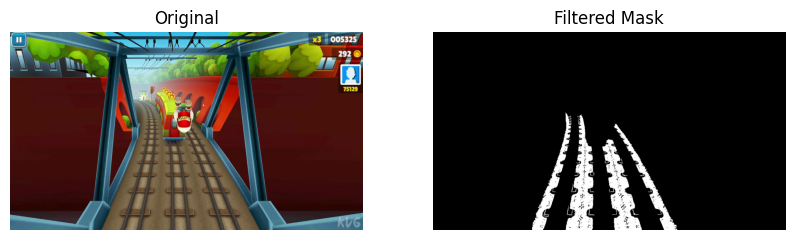

[Timing] Total highlight call: 0.429s


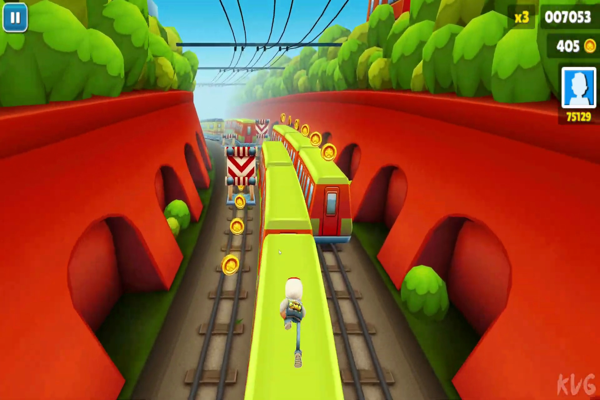

[Timing] Inference (cyclev3, cached): 0.467s
[Timing] Rail‐polygon filter: 0.000s
[Timing] Polygon→mask rasterization: 0.009s
[Timing] Color matching: 0.092s
[Timing] Component filtering: 0.013s


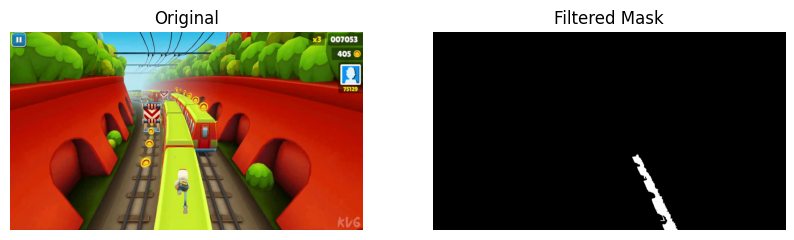

[Timing] Total highlight call: 0.379s


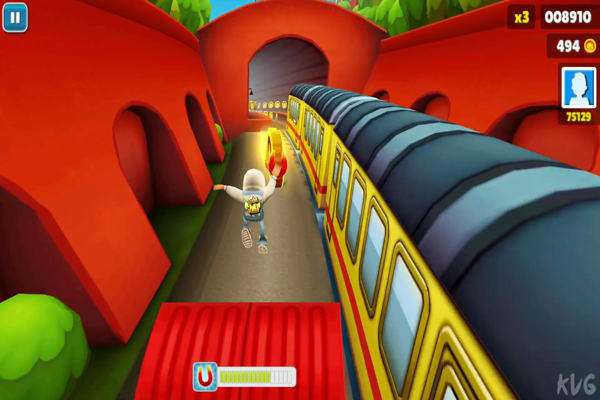

[Timing] Inference (cyclev3, cached): 0.545s
[Timing] Rail‐polygon filter: 0.000s
[Timing] Polygon→mask rasterization: 0.009s
[Timing] Color matching: 0.091s
[Timing] Component filtering: 0.015s


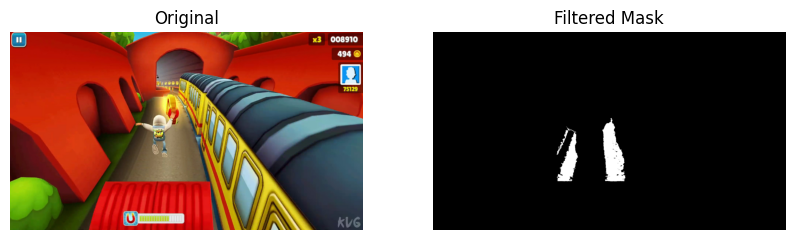

[Timing] Total highlight call: 0.379s


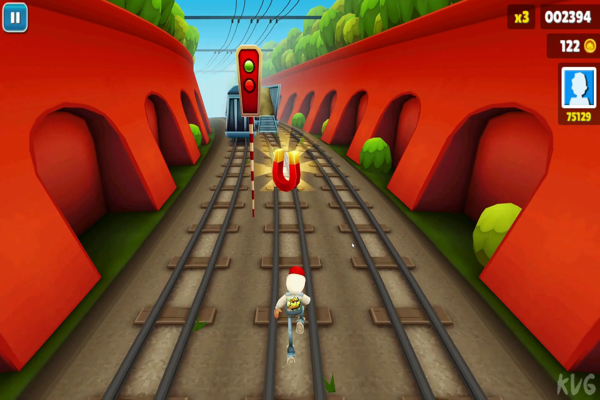

[Timing] Inference (cyclev3, cached): 0.616s
[Timing] Rail‐polygon filter: 0.000s
[Timing] Polygon→mask rasterization: 0.009s
[Timing] Color matching: 0.092s
[Timing] Component filtering: 0.021s


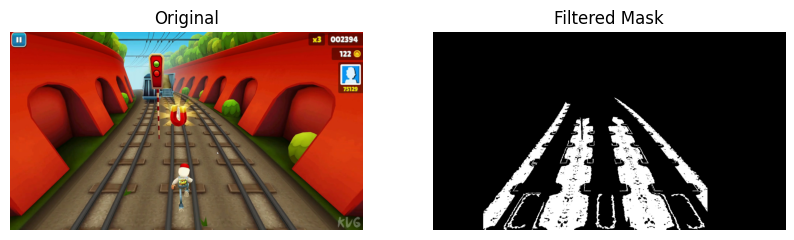

[Timing] Total highlight call: 0.412s


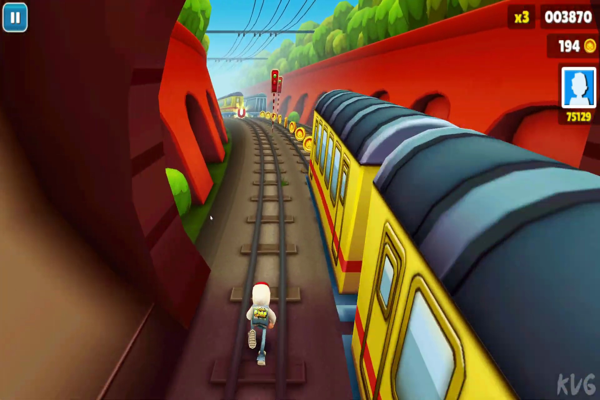

[Timing] Inference (cyclev3, cached): 0.449s
[Timing] Rail‐polygon filter: 0.000s
[Timing] Polygon→mask rasterization: 0.008s
[Timing] Color matching: 0.091s
[Timing] Component filtering: 0.015s


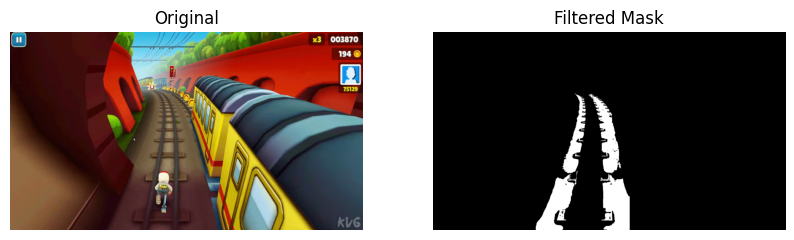

[Timing] Total highlight call: 0.382s


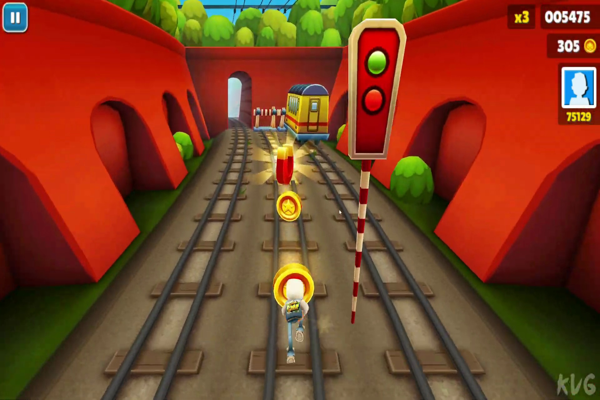

[Timing] Inference (cyclev3, cached): 0.495s
[Timing] Rail‐polygon filter: 0.000s
[Timing] Polygon→mask rasterization: 0.009s
[Timing] Color matching: 0.092s
[Timing] Component filtering: 0.016s


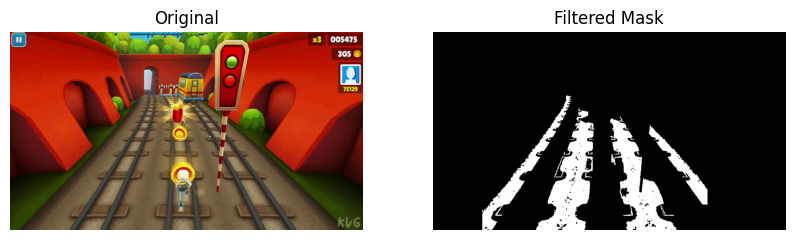

[Timing] Total highlight call: 0.461s


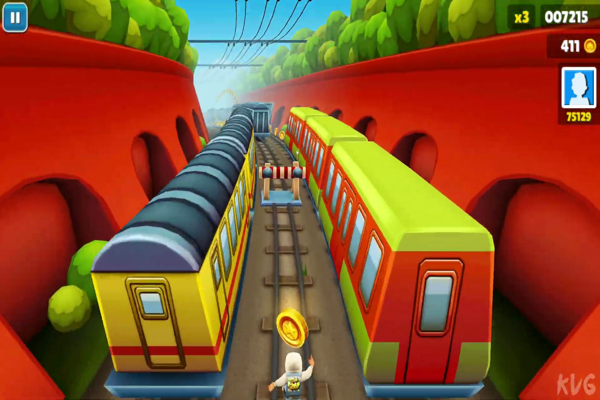

[Timing] Inference (cyclev3, cached): 0.514s
[Timing] Rail‐polygon filter: 0.000s
[Timing] Polygon→mask rasterization: 0.010s
[Timing] Color matching: 0.091s
[Timing] Component filtering: 0.011s


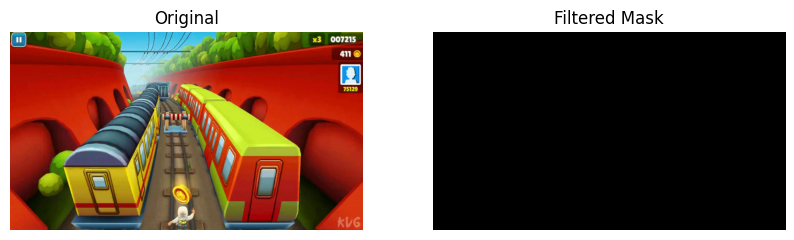

[Timing] Total highlight call: 0.370s


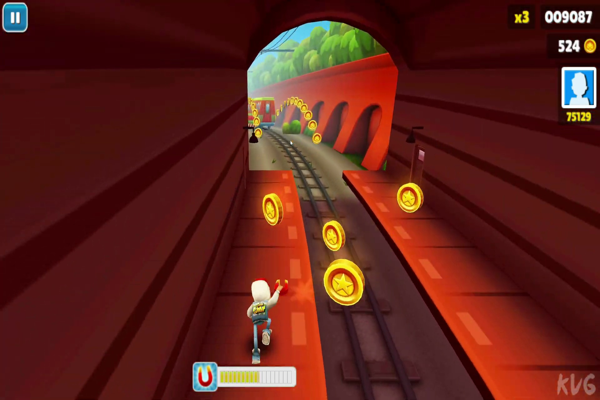

[Timing] Inference (cyclev3, cached): 0.474s
[Timing] Rail‐polygon filter: 0.000s
[Timing] Polygon→mask rasterization: 0.008s
[Timing] Color matching: 0.092s
[Timing] Component filtering: 0.017s


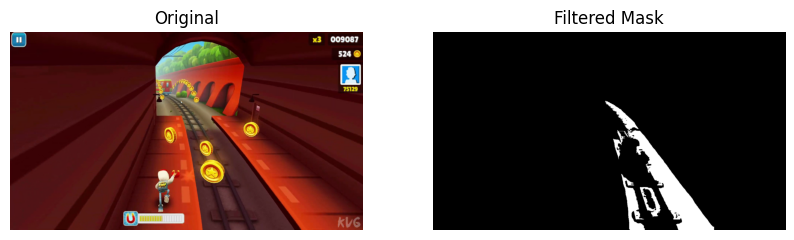

[Timing] Total highlight call: 0.376s


In [23]:
import time
import cv2
import numpy as np
import matplotlib.pyplot as plt
from functools import lru_cache

# --- 1) Cache the cyclev3 call so the model loads/runs once per unique args ---
# (Treat returned arrays as read-only to avoid side 
# effects.)
cyclev3_cached = lru_cache(maxsize=None)(cyclev3)

for j in range(0, 3):
    for i in range(0, 5):

        t0 = time.time()
        polygons, cls_ids, names, img_path = cyclev3_cached(i, j)
        t1 = time.time()
        print(f"[Timing] Inference (cyclev3, cached): {t1 - t0:.3f}s")

        # --- 2) Filter for rails (same logic) ---
        t0 = time.time()
        rail_polys = [p for p, c in zip(polygons, cls_ids) if c == 9]
        t1 = time.time()
        print(f"[Timing] Rail‐polygon filter: {t1 - t0:.3f}s")

        # --- 3) Read the image once and reuse it everywhere ---
        t0 = time.time()
        img = cv2.imread(img_path)
        rail_mask = polygon_to_mask(rail_polys[0], img.shape)
        t1 = time.time()
        print(f"[Timing] Polygon→mask rasterization: {t1 - t0:.3f}s")

        # --- 4) Same logic as before; just accept the already-loaded image instead of img_path ---
        def highlight_rails_mask_only_timed(
            img, rail_mask, target_colors_rgb, tolerance=30.0,
            min_region_size=50, min_region_height=1000
        ):
            h, w = img.shape[:2]

            # color‐matching (unchanged logic)
            t0 = time.time()
            targets_bgr = [(c[2], c[1], c[0]) for c in target_colors_rgb]
            img_f = img.astype(np.float32)
            color_mask = np.zeros((h, w), dtype=bool)
            for tb in targets_bgr:
                tb_arr = np.array(tb, dtype=np.float32).reshape((1,1,3))
                dist = np.linalg.norm(img_f - tb_arr, axis=2)
                color_mask |= (dist <= tolerance)
            t1 = time.time()
            print(f"[Timing] Color matching: {t1 - t0:.3f}s")

            # component filtering (unchanged logic)
            t0 = time.time()
            combined = rail_mask & color_mask
            comp_uint8 = combined.astype(np.uint8)
            n_labels, labels, stats, _ = cv2.connectedComponentsWithStats(comp_uint8, 8)
            filtered = np.zeros_like(combined)
            for lbl in range(1, n_labels):
                area   = stats[lbl, cv2.CC_STAT_AREA]
                height = stats[lbl, cv2.CC_STAT_HEIGHT]
                if area >= min_region_size and height >= min_region_height:
                    filtered[labels == lbl] = True
            t1 = time.time()
            print(f"[Timing] Component filtering: {t1 - t0:.3f}s")

            # display (unchanged)
            plt.figure(figsize=(10,5))
            plt.subplot(1,2,1)
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); plt.axis('off'); plt.title("Original")
            plt.subplot(1,2,2)
            plt.imshow(filtered, cmap='gray'); plt.axis('off'); plt.title("Filtered Mask")
            plt.show()

            return filtered

        # --- 5) Run the timed version (no extra image/model loads) ---
        t0 = time.time()
        filtered_mask = highlight_rails_mask_only_timed(
            img,
            rail_mask=rail_mask,
            target_colors_rgb=[(119,104,67),(81,42,45)],
            tolerance=20,
            min_region_size=50,
            min_region_height=150
        )
        t1 = time.time()
        print(f"[Timing] Total highlight call: {t1 - t0:.3f}s")
